# Exploratory Data Analysis (EDA)

1. Problem Identification
    - Data Format
        - (Warning!) Each time_value didn't have the same number of geo_value
        - Each geo_value didn't have the same number of time_value -> drop
        - Inconsistant geo_value (4 digits) -> drop
        - Insufficient geo_value (ending with 000) -> drop
    - Data Types
        - time_value -> object to timestamp
        - geo_value -> int64 to string
    - Duplicate -> No duplication
    - Outlier
    - Distribution
        - Target Variable is normal.
        - Some features are skewness.
            - 'smoothed_wtested_14d',
            - 'smoothed_wpublic_transit_1d',
            - 'smoothed_wothers_masked',
            - 'smoothed_wwearing_mask'
    - Null
        - Normal Dist -> Avg
        - Ske -> Median
    - Correlation

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import statistics
from pandas.api.types import CategoricalDtype

In [2]:
dtype = {"geo_value":"str"}
df = pd.read_csv("train_dataset.csv", dtype=dtype)

display(df.head(3))
print("Shape: ", df.shape)

,time_value,geo_value,smoothed_wspent_time_1d,smoothed_wtested_14d,smoothed_wpublic_transit_1d,smoothed_wcovid_vaccinated_or_accept,smoothed_wworried_become_ill,smoothed_wvaccine_likely_govt_health,smoothed_wshop_1d,smoothed_wtested_positive_14d,smoothed_wwork_outside_home_1d,smoothed_wothers_masked,smoothed_wcli,smoothed_wcovid_vaccinated,smoothed_wvaccine_likely_friends,smoothed_wrestaurant_1d,smoothed_wvaccine_likely_politicians,smoothed_wvaccine_likely_who,smoothed_wwearing_mask,smoothed_wlarge_event_1d
0,2021-01-07,1000,34.412959,12.541558,1.464798,54.340471,65.771681,22.086274,52.854667,29.288429,30.487852,57.334785,3.244379,2.6382,28.469582,18.571266,9.482316,24.962112,84.311759,12.627098
1,2021-01-07,1003,32.814153,10.189340,1.270183,64.989475,61.516584,25.179399,51.160278,NaN,28.384842,53.172285,1.199572,NaN,27.532881,23.406516,8.933682,28.864558,82.778220,11.727249
2,2021-01-07,1015,35.621311,14.591271,6.594649,46.390950,NaN,NaN,54.503711,NaN,37.003522,NaN,3.890709,NaN,NaN,20.974363,NaN,NaN,NaN,13.255336


Shape:  (16494, 20)


### Data Format

In [3]:
display(df.groupby(['time_value']).agg({"geo_value":"nunique"}))
print("Shape :", df.groupby(['time_value']).agg({"geo_value":"nunique"}).shape)

,geo_value
time_value,
2021-01-07,752
2021-01-08,749
2021-01-09,744
2021-01-10,738
2021-01-11,735
2021-01-12,728
2021-01-13,722
2021-01-14,724
2021-01-15,719


Shape : (23, 1)


In [4]:
display(df.groupby(['geo_value']).agg({"time_value":"nunique"}))
print("Shape :", df.groupby(['geo_value']).agg({"time_value":"nunique"}).shape)


,time_value
geo_value,
1000,23
10000,22
10001,23
10003,23
10005,23
...,...
9007,23
9009,23
9011,23


Shape : (790, 1)


In [5]:
x = pd.DataFrame(df['geo_value'].unique(), columns=['geo_value'])
x['count_fips'] = x['geo_value'].apply(lambda x : len(str(x)))
x.sort_values(['geo_value'])


,geo_value,count_fips
0,1000,4
97,10000,5
98,10001,5
99,10003,5
100,10005,5
...,...,...
92,9007,4
93,9009,4
94,9011,4
95,9013,4


### Data Type

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16494 entries, 0 to 16493
Data columns (total 20 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   time_value                            16494 non-null  object 
 1   geo_value                             16494 non-null  object 
 2   smoothed_wspent_time_1d               16405 non-null  float64
 3   smoothed_wtested_14d                  15883 non-null  float64
 4   smoothed_wpublic_transit_1d           16405 non-null  float64
 5   smoothed_wcovid_vaccinated_or_accept  15572 non-null  float64
 6   smoothed_wworried_become_ill          14354 non-null  float64
 7   smoothed_wvaccine_likely_govt_health  14076 non-null  float64
 8   smoothed_wshop_1d                     16405 non-null  float64
 9   smoothed_wtested_positive_14d         2657 non-null   float64
 10  smoothed_wwork_outside_home_1d        16405 non-null  float64
 11  smoothed_wother

### Duplication

In [7]:
df[df.duplicated(subset=df.columns, keep=False)]

,time_value,geo_value,smoothed_wspent_time_1d,smoothed_wtested_14d,smoothed_wpublic_transit_1d,smoothed_wcovid_vaccinated_or_accept,smoothed_wworried_become_ill,smoothed_wvaccine_likely_govt_health,smoothed_wshop_1d,smoothed_wtested_positive_14d,smoothed_wwork_outside_home_1d,smoothed_wothers_masked,smoothed_wcli,smoothed_wcovid_vaccinated,smoothed_wvaccine_likely_friends,smoothed_wrestaurant_1d,smoothed_wvaccine_likely_politicians,smoothed_wvaccine_likely_who,smoothed_wwearing_mask,smoothed_wlarge_event_1d


### Outlier

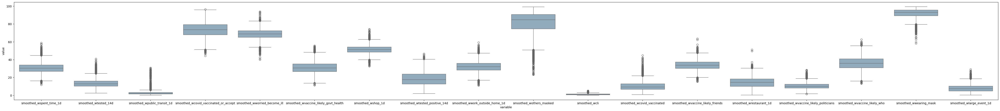

In [8]:
sns.set_palette("twilight")
plt.figure(figsize=(60, 6))
sns.boxplot(x="variable", y="value", data=pd.melt(df.drop(columns = {'time_value','geo_value'})), whis=1.5)

plt.show()

### Distribution

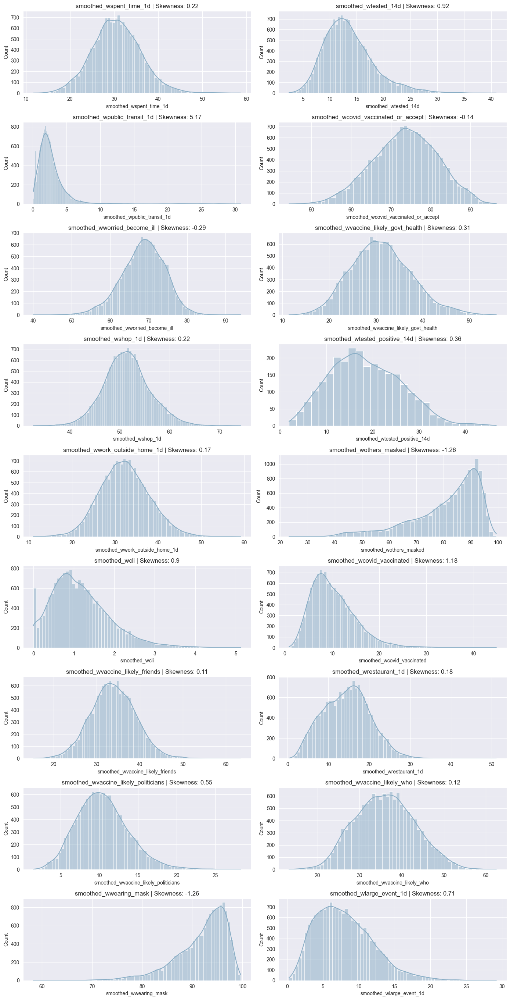

In [9]:
sns.set_style("darkgrid")

numerical_columns = df.select_dtypes(include=["int64", "float64"]).columns

plt.figure(figsize=(14, len(numerical_columns) * 3))
for idx, feature in enumerate(numerical_columns, 1):
    plt.subplot(len(numerical_columns), 2, idx)
    sns.histplot(df[feature], kde=True)
    plt.title(f"{feature} | Skewness: {round(df[feature].skew(), 2)}")

plt.tight_layout()
plt.show()

### Null Value

In [10]:
df.isnull().sum()

time_value                                  0
geo_value                                   0
smoothed_wspent_time_1d                    89
smoothed_wtested_14d                      611
smoothed_wpublic_transit_1d                89
smoothed_wcovid_vaccinated_or_accept      922
smoothed_wworried_become_ill             2140
smoothed_wvaccine_likely_govt_health     2418
smoothed_wshop_1d                          89
smoothed_wtested_positive_14d           13837
smoothed_wwork_outside_home_1d             89
smoothed_wothers_masked                  2348
smoothed_wcli                             105
smoothed_wcovid_vaccinated               2235
smoothed_wvaccine_likely_friends         2300
smoothed_wrestaurant_1d                    89
smoothed_wvaccine_likely_politicians     2494
smoothed_wvaccine_likely_who             2399
smoothed_wwearing_mask                   2042
smoothed_wlarge_event_1d                   89
dtype: int64

In [11]:
df_groupby_null = df.groupby(['time_value']).apply(lambda g: g.isnull().sum()).drop(columns=['time_value']).reset_index()
df_groupby_null.head()
pd.melt(df_groupby_null, id_vars=['time_value'], value_vars=[a_col for a_col in df.columns if a_col not in ['time_value']]).sort_values(by = ['time_value','variable']).reset_index(drop = True)

C:\Users\Asus\AppData\Local\Temp\ipykernel_24928\1232048849.py:1: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df_groupby_null = df.groupby(['time_value']).apply(lambda g: g.isnull().sum()).drop(columns=['time_value']).reset_index()


,time_value,variable,value
0,2021-01-07,geo_value,0
1,2021-01-07,smoothed_wcli,5
2,2021-01-07,smoothed_wcovid_vaccinated,544
3,2021-01-07,smoothed_wcovid_vaccinated_or_accept,43
4,2021-01-07,smoothed_wlarge_event_1d,4
...,...,...,...
432,2021-01-29,smoothed_wvaccine_likely_politicians,137
433,2021-01-29,smoothed_wvaccine_likely_who,132
434,2021-01-29,smoothed_wwearing_mask,89
435,2021-01-29,smoothed_wwork_outside_home_1d,3


In [12]:
df_nullrow = pd.DataFrame(df.isnull().sum(axis=1), columns=['num_nul_col'])
df_nullrow

,num_nul_col
0,0
1,2
2,9
3,2
4,2
...,...
16489,1
16490,1
16491,1
16492,1


In [13]:
df_nullrow.reset_index().groupby(['num_nul_col']).agg({"index":"nunique"})

,index
num_nul_col,
0,2552
1,10018
2,1217
3,122
4,112
5,316
6,147
7,201
8,768


### Correlation

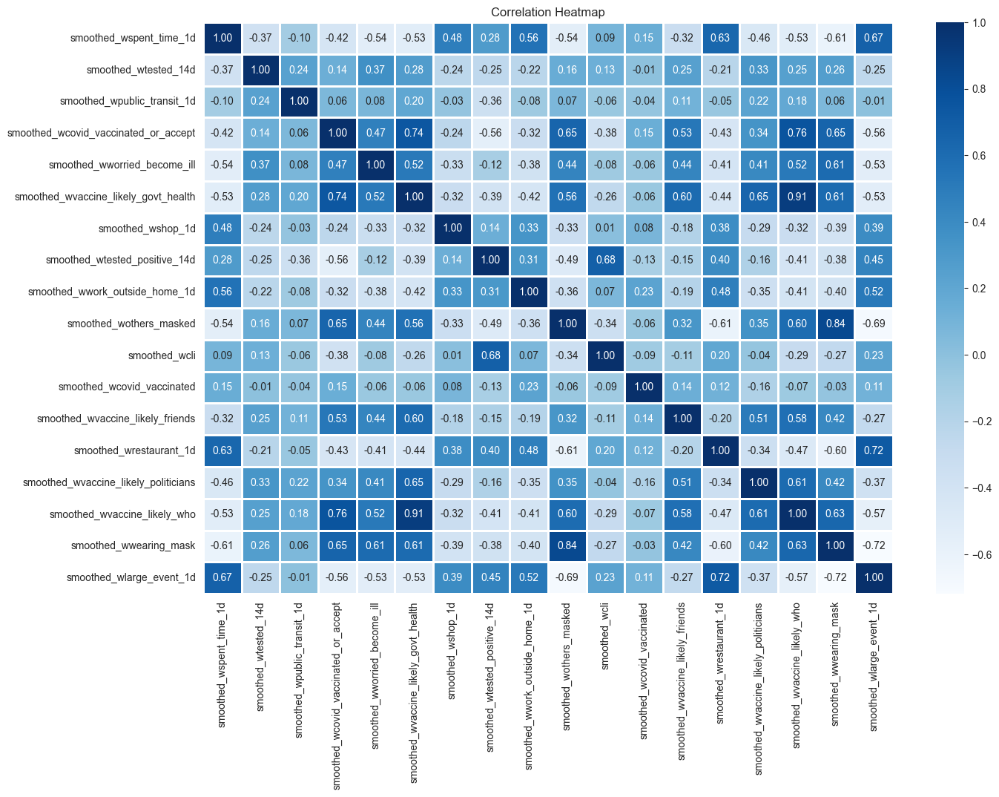

In [14]:
plt.figure(figsize=(15, 10))

sns.heatmap(df.drop(columns = {'time_value','geo_value'}).corr(), annot=True, fmt='.2f', cmap='Blues', linewidths=2)

plt.title('Correlation Heatmap')
plt.show()

### Pair Plot

<Figure size 1000x600 with 0 Axes>

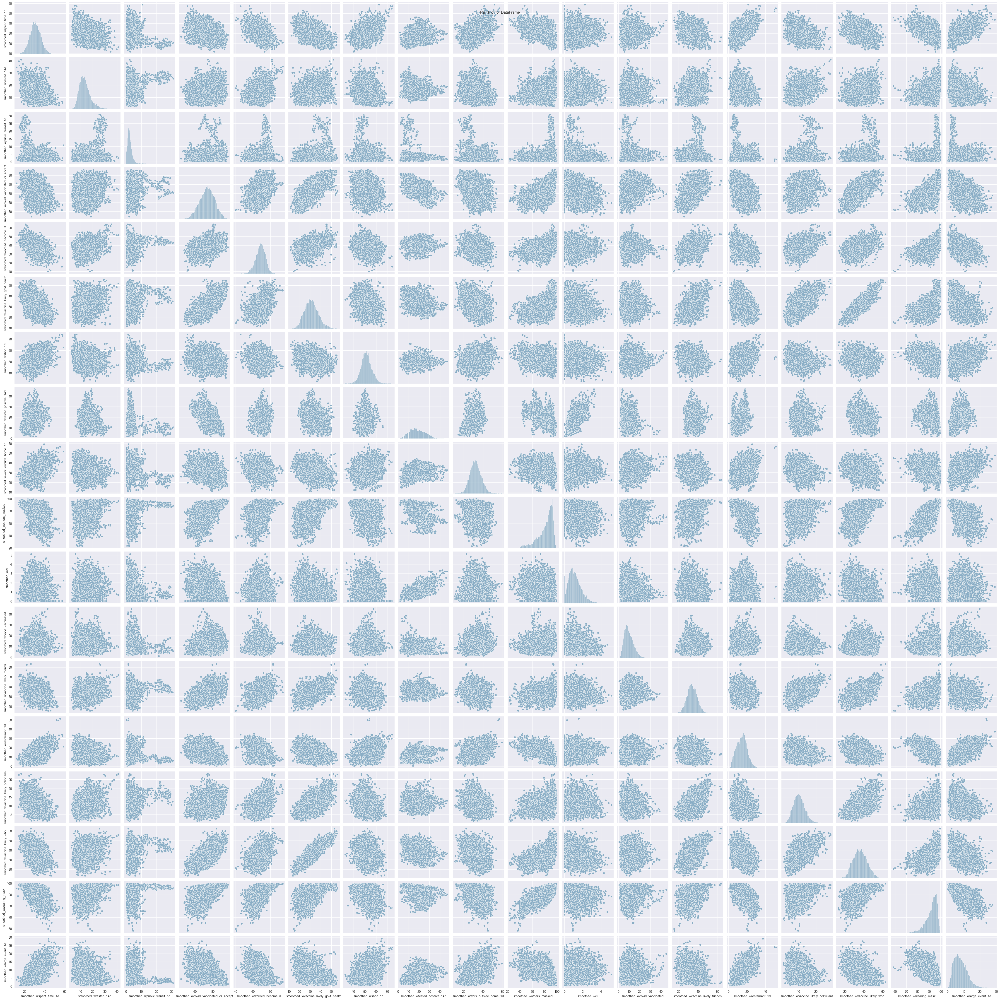

In [15]:
sns.set_palette("twilight")

plt.figure(figsize=(10, 6))

sns.pairplot(df.drop(columns = {'time_value','geo_value'}))

plt.suptitle('Pair Plot for DataFrame')
plt.show()

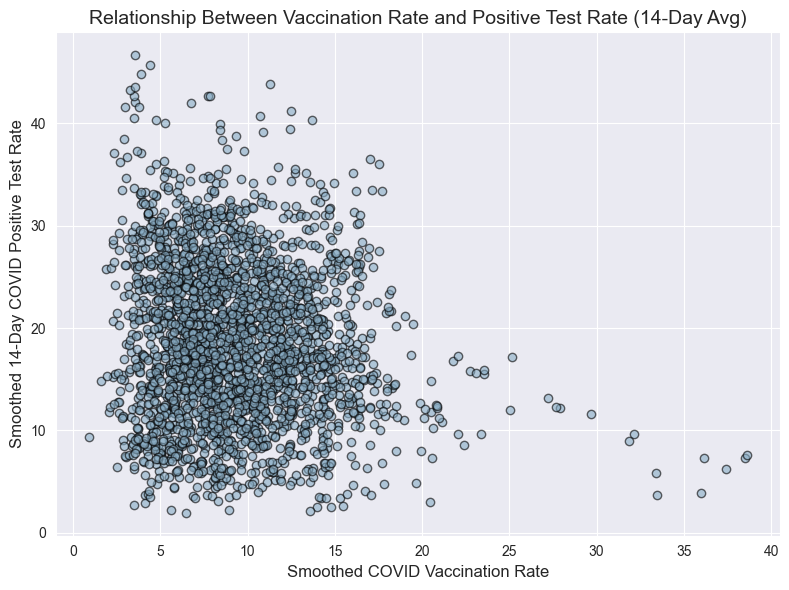

In [18]:
plt.figure(figsize=(8, 6))
plt.scatter(df['smoothed_wcovid_vaccinated'], df['smoothed_wtested_positive_14d'], alpha=0.6, edgecolor='k')
plt.title("Relationship Between Vaccination Rate and Positive Test Rate (14-Day Avg)", fontsize=14)
plt.xlabel("Smoothed COVID Vaccination Rate", fontsize=12)
plt.ylabel("Smoothed 14-Day COVID Positive Test Rate", fontsize=12)
plt.grid(True)
plt.tight_layout()
plt.show()
